In [101]:
import pandas as pd


In [102]:
# Making list of  columns and then remove characters then having another list and selecting columns with that number

In [103]:
import re
# Reading data
df = pd.read_csv('../kianadata/allNBMod.csv')
# Extracting column names
cols_name = df.columns.tolist()
print(cols_name)
new_cols_name = []
for col in cols_name:
    if (col[0].isdigit()):
        new_col = re.sub("[^0-9]", "",col)
        new_cols_name.append(new_col)
print(new_cols_name)


['Unnamed: 0', 'rownum', 'date_time', '2734GP', '2734_ST', '2734HOV', '2733GP', '2733_ST', '2733HOV', '2736GP', '2736_ST', '2736HOV', '2739GP', '2739_ST', '2739HOV', '2743GP', '2743_ST', '2743HOV', '2732GP', '2732_ST', '2732HOV', '2742GP', '2742_ST', '2742HOV', '2740GP', '2740_ST', '2740HOV', '2735GP', '2735_ST', '2735HOV', '2774GP', '2774_ST', '2774HOV', '2731GP', '2731_ST', '2731HOV', '2738GP', '2738_ST', '2738HOV', '2741GP', '2741_ST', '2741HOV']
['2734', '2734', '2734', '2733', '2733', '2733', '2736', '2736', '2736', '2739', '2739', '2739', '2743', '2743', '2743', '2732', '2732', '2732', '2742', '2742', '2742', '2740', '2740', '2740', '2735', '2735', '2735', '2774', '2774', '2774', '2731', '2731', '2731', '2738', '2738', '2738', '2741', '2741', '2741']


In [104]:
print(set(new_cols_name))
for element in set(new_cols_name):
    col1 = element + 'HOV'
    col2 = element + 'GP'
    print(col1,col2)
    dftemp = df[['date_time',col1,col2]]
    # Number of total records
    print("Number of total records", dftemp.shape[0])
    # Number of Nan
    for col in dftemp.columns.tolist():
        if col != 'date_time':
            df_wo_nan = dftemp[col].dropna()
            print("Number of nan for", col, ":", dftemp.shape[0] - df_wo_nan.shape[0])
    # Number of negative number
    for col in ( dftemp.columns.tolist()):
        if col != 'date_time':
            df_wo_nan = dftemp[col].dropna()
            df_wo_neg = df_wo_nan >=0
            print("Number of neg for", col, ":", df_wo_nan.shape[0] - df_wo_neg.shape[0])

set(['2734', '2735', '2736', '2731', '2732', '2733', '2738', '2774', '2739', '2741', '2740', '2743', '2742'])
('2734HOV', '2734GP')
('Number of total records', 75168)
('Number of nan for', '2734HOV', ':', 2638)
('Number of nan for', '2734GP', ':', 2080)
('Number of neg for', '2734HOV', ':', 0)
('Number of neg for', '2734GP', ':', 0)
('2735HOV', '2735GP')
('Number of total records', 75168)
('Number of nan for', '2735HOV', ':', 2288)
('Number of nan for', '2735GP', ':', 2022)
('Number of neg for', '2735HOV', ':', 0)
('Number of neg for', '2735GP', ':', 0)
('2736HOV', '2736GP')
('Number of total records', 75168)
('Number of nan for', '2736HOV', ':', 2003)
('Number of nan for', '2736GP', ':', 1843)
('Number of neg for', '2736HOV', ':', 0)
('Number of neg for', '2736GP', ':', 0)
('2731HOV', '2731GP')
('Number of total records', 75168)
('Number of nan for', '2731HOV', ':', 2288)
('Number of nan for', '2731GP', ':', 2022)
('Number of neg for', '2731HOV', ':', 0)
('Number of neg for', '2731GP'

In [105]:
## Replacing the nan and negative values
# Replacing negative with nan
import numpy as np
for col in (df.columns.tolist()):
    if col != 'date_time':
        df[col][df[col]<0] = np.NaN
        
# Replacng nan by forward/backward filling
df.fillna(method='ffill', inplace = True)
df.fillna(method='bfill', inplace = True)

# Number of Nan
for col in df.columns.tolist():
    if col != 'date_time':
        df_wo_nan = df[col].dropna()
        print("Number of nan for", col, ":", df.shape[0] - df_wo_nan.shape[0])
# Min and Max
for col in df.columns.tolist():
    if col != 'date_time':
        print("Min", col, ":", df[col].min())
        print("Max", col, ":", df[col].max())

/Users/Kiana/miniconda3/envs/python27/lib/python2.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


('Number of nan for', 'Unnamed: 0', ':', 0)
('Number of nan for', 'rownum', ':', 0)
('Number of nan for', '2734GP', ':', 0)
('Number of nan for', '2734_ST', ':', 0)
('Number of nan for', '2734HOV', ':', 0)
('Number of nan for', '2733GP', ':', 0)
('Number of nan for', '2733_ST', ':', 0)
('Number of nan for', '2733HOV', ':', 0)
('Number of nan for', '2736GP', ':', 0)
('Number of nan for', '2736_ST', ':', 0)
('Number of nan for', '2736HOV', ':', 0)
('Number of nan for', '2739GP', ':', 0)
('Number of nan for', '2739_ST', ':', 0)
('Number of nan for', '2739HOV', ':', 0)
('Number of nan for', '2743GP', ':', 0)
('Number of nan for', '2743_ST', ':', 0)
('Number of nan for', '2743HOV', ':', 0)
('Number of nan for', '2732GP', ':', 0)
('Number of nan for', '2732_ST', ':', 0)
('Number of nan for', '2732HOV', ':', 0)
('Number of nan for', '2742GP', ':', 0)
('Number of nan for', '2742_ST', ':', 0)
('Number of nan for', '2742HOV', ':', 0)
('Number of nan for', '2740GP', ':', 0)
('Number of nan for', 

['Unnamed: 0', 'rownum', '2759GP', '2759_ST', '2759HOV', '2753GP', '2753_ST', '2753HOV', '2748GP', '2748_ST', '2748HOV', '2755GP', '2755_ST', '2755HOV', '2757GP', '2757_ST', '2757HOV', '2760GP', '2760_ST', '2760HOV', '2758GP', '2758_ST', '2758HOV', '2754GP', '2754_ST', '2754HOV', '2756GP', '2756_ST', '2756HOV', '2750GP', '2750_ST', '2750HOV', '2745GP', '2745_ST', '2745HOV', '2744GP', '2744_ST', '2744HOV', '2746GP', '2746_ST', '2746HOV', '2749GP', '2749_ST', '2749HOV', '2751GP', '2751_ST', '2751HOV', '2752GP', '2752_ST', '2752HOV']


In [81]:
columns = df.columns.tolist()
columns.remove('date_time')
columns.remove('Unnamed: 0')
columns.remove('rownum')
newcolumns = columns
print(newcolumns)

['2734GP', '2734_ST', '2734HOV', '2733GP', '2733_ST', '2733HOV', '2736GP', '2736_ST', '2736HOV', '2739GP', '2739_ST', '2739HOV', '2743GP', '2743_ST', '2743HOV', '2732GP', '2732_ST', '2732HOV', '2742GP', '2742_ST', '2742HOV', '2740GP', '2740_ST', '2740HOV', '2735GP', '2735_ST', '2735HOV', '2774GP', '2774_ST', '2774HOV', '2731GP', '2731_ST', '2731HOV', '2738GP', '2738_ST', '2738HOV', '2741GP', '2741_ST', '2741HOV']


['2734GP', '2734_ST', '2734HOV', '2733GP', '2733_ST', '2733HOV', '2736GP', '2736_ST', '2736HOV', '2739GP', '2739_ST', '2739HOV', '2743GP', '2743_ST', '2743HOV', '2732GP', '2732_ST', '2732HOV', '2742GP', '2742_ST', '2742HOV', '2740GP', '2740_ST', '2740HOV', '2735GP', '2735_ST', '2735HOV', '2774GP', '2774_ST', '2774HOV', '2731GP', '2731_ST', '2731HOV', '2738GP', '2738_ST', '2738HOV', '2741GP', '2741_ST', '2741HOV']


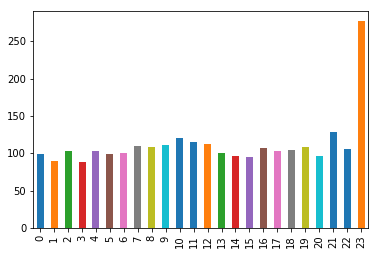

In [82]:
print(newcolumns)
df['date_time'] = pd.to_datetime(df['date_time'])
# Analyzing the Nan values
for col in (newcolumns):
    if col.endswith('_ST') == False:
        dftemp = df[['date_time',col]]
        dfnan = dftemp[dftemp[col].isnull()]
        dfnan = dfnan.assign(hour= dfnan['date_time'].dt.hour)
        order = np.arange(0,24).tolist()
        dfnan['hour'].value_counts().sort_index().plot('bar')
        text = "nan" +"NB" + str(col)
        plt.savefig(text, dpi=100)

              

In [ ]:
columns = df.columns.tolist()
columns.remove('date_time')
newcolumns = columns
print(newcolumns)

In [ ]:
df['date_time'] = pd.to_datetime(df['date_time'])
import datetime as dt
import seaborn as sns
import matplotlib.pyplot as plt
for col in newcolumns:
    dfnew = df[['date_time',col]]
    dfnew = dfnew.assign(month= dfnew['date_time'].dt.month)
    dfnew = dfnew.assign(year= dfnew['date_time'].dt.year)
    dfnew = dfnew.assign(hour= dfnew['date_time'].dt.hour)
    dfnew = dfnew.assign(day= dfnew['date_time'].dt.dayofweek)
    dfnew =  dfnew[ dfnew['year'] == 2018]
    dfnew = dfnew[['date_time','month','day','hour',col]]
    dfnew.rename(columns={str(col): "TravelTime"},inplace =True)
    palette = sns.color_palette(['#1f77b4','#ff7f0e', '#2ca02c', '#d62728', '#9467bd',"#e377c2","#bcbd22"])
    fig, axes= plt.subplots(7, sharex=True,sharey=True,figsize=(12, 28))
    plt.grid(False)
    plt.xticks(np.arange(0,24))
    plt.xlabel('Time of day')
    legend =[]
    name = []
    plt.yticks(np.arange(0,3000,500))
    count = 0
    for i in  [0,1,2,3,4]:
        name.append(i)
        k = palette.pop(0)
        dfnew1 = dfnew[dfnew['day'] == i]
        x = pd.DataFrame()
        x = pd.DataFrame({"A": range(0,24)})
        y = pd.DataFrame()
        y = pd.DataFrame(np.zeros((24,1)))
        y1 = pd.DataFrame(np.zeros((24,1)))
        yplus = pd.DataFrame(np.zeros((24,1)))
        yminus = pd.DataFrame(np.zeros((24,1)))
        category_data = pd.DataFrame(np.zeros((24,4)))
        for hour in range(0,24):
            y.iloc[hour,0] = (np.median(dfnew1[dfnew1['hour'] == hour].TravelTime))
            if((dfnew1[dfnew1['hour'] == hour].TravelTime).size == 0):
                yminus.iloc[hour,0] = 0
                y.iloc[hour,0] = 0
            else :
                yminus.iloc[hour,0] = np.percentile(dfnew1[dfnew1['hour'] == hour].TravelTime,10)
            if((dfnew1[dfnew1['hour'] == hour].TravelTime).size == 0):
                yplus.iloc[hour,0] = 0
            else :
                yplus.iloc[hour,0] = np.percentile(dfnew1[dfnew1['hour'] == hour].TravelTime,90)
            category_data.iloc[hour,0] =  x.iloc[hour,0] 
            category_data.iloc[hour,1] =  y.iloc[hour,0] 
            category_data.iloc[hour,2] = yminus.iloc[hour,0] 
            category_data.iloc[hour,3] = yplus.iloc[hour,0] 
        print( category_data)
        index = np.arange(0,24)
        if (i ==0):
            namel = 'Monday'
        elif(i ==1):
            namel = 'Tuesday'
        elif(i ==2):
            namel ='Wednesday'
        elif(i == 3):
            namel = 'Thursday'
        elif(i == 4):
            namel = 'Friday'
        elif(i== 5):
            namel = 'Saturday'
        elif(i ==6):
            namel ='Sunday'
        l, = axes[count].plot(category_data.iloc[:,0],category_data.iloc[:,1],color=k, label = namel)
        axes[count].fill_between(category_data.iloc[:,0], y1=category_data.iloc[:,2],y2=category_data.iloc[:,3],alpha=0.20, facecolor=k)
        legend.append(l)
        count = count +1
    fig.text(0.06, 0.5, 'Travel time', va='center', rotation='vertical')
    plt.legend(legend,['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'],bbox_to_anchor=(0.32, 8.5),ncol = 4, loc='center',prop={'size': 12 })
    text = "section" +str(col) + "_hourly.png"
    plt.savefig(text, dpi=100)


In [ ]:
for ind, i in enumerate(range(0,60,5)):
    print(ind, i)

In [ ]:
df['date_time'] = pd.to_datetime(df['date_time'])
from __future__ import division
import datetime as dt
import seaborn as sns
import matplotlib.pyplot as plt
for col in newcolumns:
    dfnew = df[['date_time',col]]
    dfnew = dfnew.assign(month= dfnew['date_time'].dt.month)
    dfnew = dfnew.assign(year= dfnew['date_time'].dt.year)
    dfnew = dfnew.assign(hour= dfnew['date_time'].dt.hour)
    dfnew = dfnew.assign(minute= dfnew['date_time'].dt.minute)
    dfnew = dfnew.assign(day= dfnew['date_time'].dt.dayofweek)
    dfnew =  dfnew[ dfnew['year'] == 2018]
    dfnew = dfnew[['date_time','month','day','hour','minute',col]]
    dfnew.rename(columns={str(col): "TravelTime"},inplace =True)
    palette = sns.color_palette(['#1f77b4','#ff7f0e', '#2ca02c', '#d62728', '#9467bd',"#e377c2","#bcbd22"])
    fig, axes= plt.subplots(5, sharex=True,sharey=True,figsize=(12, 20))
    plt.grid(False)
    plt.xlabel('Time of day')
    legend =[]
    name = []
    plt.yticks(np.arange(0,60,5))
    plt.xticks(np.arange(0,288,12))
    count = 0
    for i in  [0,1,2,3,4]:
        name.append(i)
        k = palette.pop(0)
        dfnew1 = dfnew[dfnew['day'] == i]
        #x = pd.DataFrame()
        x = pd.DataFrame({"A": range(0,288)})
        #y = pd.DataFrame()
        y = pd.DataFrame(np.zeros((288,1)))
        y1 = pd.DataFrame(np.zeros((288,1)))
        yplus = pd.DataFrame(np.zeros((288,1)))
        yminus = pd.DataFrame(np.zeros((288,1)))
        category_data = pd.DataFrame(np.zeros((288,4)))
        for hour in range(0,24):
            for ind, minute in enumerate(range(0,60,5)):
                y.iloc[12*hour+ind,0] = (np.median(dfnew1[(dfnew1['hour'] == hour) & (dfnew1['minute'] == minute)].TravelTime)/60)
                if((dfnew1[dfnew1['hour'] == hour].TravelTime).size == 0):
                    yminus.iloc[12*hour+ind,0] = 0
                    y.iloc[12*hour+ind,0] = 0
                else :
                    yminus.iloc[12*hour+ind,0] = np.percentile(dfnew1[(dfnew1['hour'] == hour) & (dfnew1['minute'] == minute)].TravelTime,10)/60
                if((dfnew1[dfnew1['hour'] == hour].TravelTime).size == 0):
                    yplus.iloc[12*hour+ind,0] = 0
                else :
                    yplus.iloc[12*hour+ind,0] = np.percentile(dfnew1[(dfnew1['hour'] == hour) & (dfnew1['minute'] == minute)].TravelTime,90)/60
                category_data.iloc[12*hour+ind,0] =  x.iloc[12*hour+ind,0] 
                category_data.iloc[12*hour+ind,1] =  y.iloc[12*hour+ind,0] 
                category_data.iloc[12*hour+ind,2] = yminus.iloc[12*hour+ind,0] 
                category_data.iloc[12*hour+ind,3] = yplus.iloc[12*hour+ind,0] 
        index = np.arange(0,24)
        if (i ==0):
            namel = 'Monday'
        elif(i ==1):
            namel = 'Tuesday'
        elif(i ==2):
            namel ='Wednesday'
        elif(i == 3):
            namel = 'Thursday'
        elif(i == 4):
            namel = 'Friday'
        elif(i== 5):
            namel = 'Saturday'
        elif(i ==6):
            namel ='Sunday'
        l, = axes[count].plot(category_data.iloc[:,0],category_data.iloc[:,1],color=k, label = namel)
        axes[count].fill_between(category_data.iloc[:,0], y1=category_data.iloc[:,2],y2=category_data.iloc[:,3],alpha=0.20, facecolor=k)
        legend.append(l)
        count = count +1
    fig.text(0.06, 0.5, 'Travel time', va='center', rotation='vertical')
    plt.legend(legend,['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'],bbox_to_anchor=(0.25, 5.65),ncol = 3, loc='center',prop={'size': 12 })
    axes[count-1].set_xticklabels(np.arange(0,24))
    text = "section" +str(col) + "_hourly.png"
    plt.savefig(text, dpi=100)

In [6]:
df['date_time'] = pd.to_datetime(df['date_time'])
from __future__ import division
import datetime as dt
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
# 
for element in set(new_cols_name):
    col1 = element + 'GP'
    col2 = element + 'HOV'
    dfnew = df[['date_time',col1,col2]]
    dfnew = dfnew.assign(month= dfnew['date_time'].dt.month)
    dfnew = dfnew.assign(year= dfnew['date_time'].dt.year)
    dfnew = dfnew.assign(hour= dfnew['date_time'].dt.hour)
    dfnew = dfnew.assign(minute= dfnew['date_time'].dt.minute)
    dfnew = dfnew.assign(day= dfnew['date_time'].dt.dayofweek)
    dfnew =  dfnew[ dfnew['year'] == 2018]
    dfnew = dfnew[['date_time','month','day','hour','minute',col1,col2]]
    dfnew.rename(columns={str(col1): "TravelTime_GP"},inplace =True)
    dfnew.rename(columns={str(col2): "TravelTime_HOV"},inplace =True)
    palette_GP = sns.color_palette(['#1f77b4','#ff7f0e', '#2ca02c', '#d62728', '#9467bd',"#e377c2","#bcbd22"])
    palette_HOV = sns.color_palette(['#001D4D','#9F3100', '#003900', '#960000', '#2C0755',"#72005A","#4B5700"])
    fig, axes= plt.subplots(5, sharex=True,sharey=True,figsize=(12, 20))
    plt.grid(False)
    plt.xlabel('Time of day')
    name = []
    plt.yticks(np.arange(0,60,5))
    plt.xticks(np.arange(0,288,12))
    count = 0
    for i in  [0,1,2,3,4]:
        legend =[]
        name.append(i)
        k_GP = palette_GP.pop(0)
        k_HOV = palette_HOV.pop(0)
        dfnew1 = dfnew[dfnew['day'] == i]
        x_GP = pd.DataFrame({"A": range(0,288)})
        y_GP = pd.DataFrame(np.zeros((288,1)))
        y1_GP = pd.DataFrame(np.zeros((288,1)))
        yplus_GP = pd.DataFrame(np.zeros((288,1)))
        yminus_GP = pd.DataFrame(np.zeros((288,1)))
        x_HOV = pd.DataFrame({"A": range(0,288)})
        y_HOV = pd.DataFrame(np.zeros((288,1)))
        y1_HOV = pd.DataFrame(np.zeros((288,1)))
        yplus_HOV = pd.DataFrame(np.zeros((288,1)))
        yminus_HOV = pd.DataFrame(np.zeros((288,1)))
        category_data_GP = pd.DataFrame(np.zeros((288,4)))
        category_data_HOV = pd.DataFrame(np.zeros((288,4)))
        for hour in range(0,24):
            for ind, minute in enumerate(range(0,60,5)):
                y_GP.iloc[12*hour+ind,0] = (np.median(dfnew1[(dfnew1['hour'] == hour) & (dfnew1['minute'] == minute)].TravelTime_GP)/60)
                if((dfnew1[dfnew1['hour'] == hour].TravelTime_GP).size == 0):
                    yminus_GP.iloc[12*hour+ind,0] = 0
                    y_GP.iloc[12*hour+ind,0] = 0
                else :
                    yminus_GP.iloc[12*hour+ind,0] = np.percentile(dfnew1[(dfnew1['hour'] == hour) & (dfnew1['minute'] == minute)].TravelTime_GP,10)/60
                if((dfnew1[dfnew1['hour'] == hour].TravelTime_GP).size == 0):
                    yplus_GP.iloc[12*hour+ind,0] = 0
                else :
                    yplus_GP.iloc[12*hour+ind,0] = np.percentile(dfnew1[(dfnew1['hour'] == hour) & (dfnew1['minute'] == minute)].TravelTime_GP,90)/60
                category_data_GP.iloc[12*hour+ind,0] =  x_GP.iloc[12*hour+ind,0] 
                category_data_GP.iloc[12*hour+ind,1] =  y_GP.iloc[12*hour+ind,0] 
                category_data_GP.iloc[12*hour+ind,2] = yminus_GP.iloc[12*hour+ind,0] 
                category_data_GP.iloc[12*hour+ind,3] = yplus_GP.iloc[12*hour+ind,0] 
                y_HOV.iloc[12*hour+ind,0] = (np.median(dfnew1[(dfnew1['hour'] == hour) & (dfnew1['minute'] == minute)].TravelTime_HOV)/60)
                if((dfnew1[dfnew1['hour'] == hour].TravelTime_HOV).size == 0):
                    yminus_HOV.iloc[12*hour+ind,0] = 0
                    y_HOV.iloc[12*hour+ind,0] = 0
                else :
                    yminus_HOV.iloc[12*hour+ind,0] = np.percentile(dfnew1[(dfnew1['hour'] == hour) & (dfnew1['minute'] == minute)].TravelTime_HOV,10)/60
                if((dfnew1[dfnew1['hour'] == hour].TravelTime_HOV).size == 0):
                    yplus_HOV.iloc[12*hour+ind,0] = 0
                else :
                    yplus_HOV.iloc[12*hour+ind,0] = np.percentile(dfnew1[(dfnew1['hour'] == hour) & (dfnew1['minute'] == minute)].TravelTime_HOV,90)/60
                category_data_HOV.iloc[12*hour+ind,0] =  x_HOV.iloc[12*hour+ind,0] 
                category_data_HOV.iloc[12*hour+ind,1] =  y_HOV.iloc[12*hour+ind,0] 
                category_data_HOV.iloc[12*hour+ind,2] = yminus_HOV.iloc[12*hour+ind,0] 
                category_data_HOV.iloc[12*hour+ind,3] = yplus_HOV.iloc[12*hour+ind,0] 
        index = np.arange(0,24)
        if (i ==0):
            name_HOV = 'Monday_HOV'
            name_GP = 'Monday_GP'
        elif(i ==1):
            name_HOV = 'Tuesday_HOV'
            name_GP = 'Tuesday_GP'
        elif(i ==2):
            name_HOV ='Wednesday_HOV'
            name_GP ='Wednesday_GP'
        elif(i == 3):
            name_HOV = 'Thursday_HOV'
            name_GP = 'Thursday_GP'
        elif(i == 4):
            name_HOV = 'Friday_HOV'
            name_GP = 'Friday_GP'
        elif(i== 5):
            name_HOV = 'Saturday_HOV'
            name_GP = 'Saturday_GP'
        elif(i ==6):
            name_HOV ='Sunday_HOV'
            name_GP ='Sunday_GP'
        l, = axes[count].plot(category_data_GP.iloc[:,0],category_data_GP.iloc[:,1],color=k_GP, label = name_GP)
        axes[count].fill_between(category_data_GP.iloc[:,0], y1=category_data_GP.iloc[:,2],y2=category_data_GP.iloc[:,3],alpha=0.20, facecolor=k_GP)
        legend.append(l)
        l1, = axes[count].plot(category_data_HOV.iloc[:,0],category_data_HOV.iloc[:,1],color=k_HOV, label = name_HOV)
        axes[count].fill_between(category_data_HOV.iloc[:,0], y1=category_data_HOV.iloc[:,2],y2=category_data_HOV.iloc[:,3],alpha=0.20, facecolor=k_HOV)
        legend.append(l1)
        axes[count].legend(loc="upper right")
        count = count +1

    fig.text(0.06, 0.5, 'Travel time', va='center', rotation='vertical')
    #plt.legend(legend,['Monday_GP', 'Monday_HOV','Tuesday_GP','Tuesday_HOV','Wednesday_GP','Wednesday_HOV','Thursday_GP','Thursday_HOV','Friday_GP','Friday_HOV'],bbox_to_anchor=(0.25, 5.65),ncol = 3, loc='center',prop={'size': 12 })
    axes[count-1].set_xticklabels(np.arange(0,24))
    text = "sectionALL" +str(col1)+str(col2) + "SB_hourly.png"
#     plt.rc('figure', titlesize=80)
#     plt.rc('font', size=120)
    plt.savefig(text, dpi=100)

In [188]:
print(new_cols_name)

['2734', '2734', '2734', '2733', '2733', '2733', '2736', '2736', '2736', '2739', '2739', '2739', '2743', '2743', '2743', '2732', '2732', '2732', '2742', '2742', '2742', '2740', '2740', '2740', '2735', '2735', '2735', '2774', '2774', '2774', '2731', '2731', '2731', '2738', '2738', '2738', '2741', '2741', '2741']


               2734GP
date_time            
2018-01-01  15.380000
2018-01-02  18.179306
2018-01-03  17.292656
2018-01-04  19.923079
2018-01-05  19.871453
2018-01-06        NaN
2018-01-07        NaN
2018-01-08  17.735388
2018-01-09  19.333021
2018-01-10  18.164306
2018-01-11  16.721823
2018-01-12  18.207106
2018-01-13        NaN
2018-01-14        NaN
2018-01-15  16.729682
2018-01-16  18.361354
2018-01-17  18.246348
2018-01-18  19.417083
2018-01-19  18.016233
2018-01-20        NaN
2018-01-21        NaN
2018-01-22  16.473837
2018-01-23  20.208432
2018-01-24  17.935851
2018-01-25  16.640810
2018-01-26  16.415671
2018-01-27        NaN
2018-01-28        NaN
2018-01-29  17.650399
2018-01-30  18.155787
2018-01-31  16.352436
hihii
               2734GP
date_time            
2018-02-01  18.127512
2018-02-02  18.147135
2018-02-03        NaN
2018-02-04        NaN
2018-02-05  16.835874
2018-02-06  17.994757
2018-02-07  16.443791
2018-02-08  19.721331
2018-02-09  16.948669
2018-02-10        NaN
2018

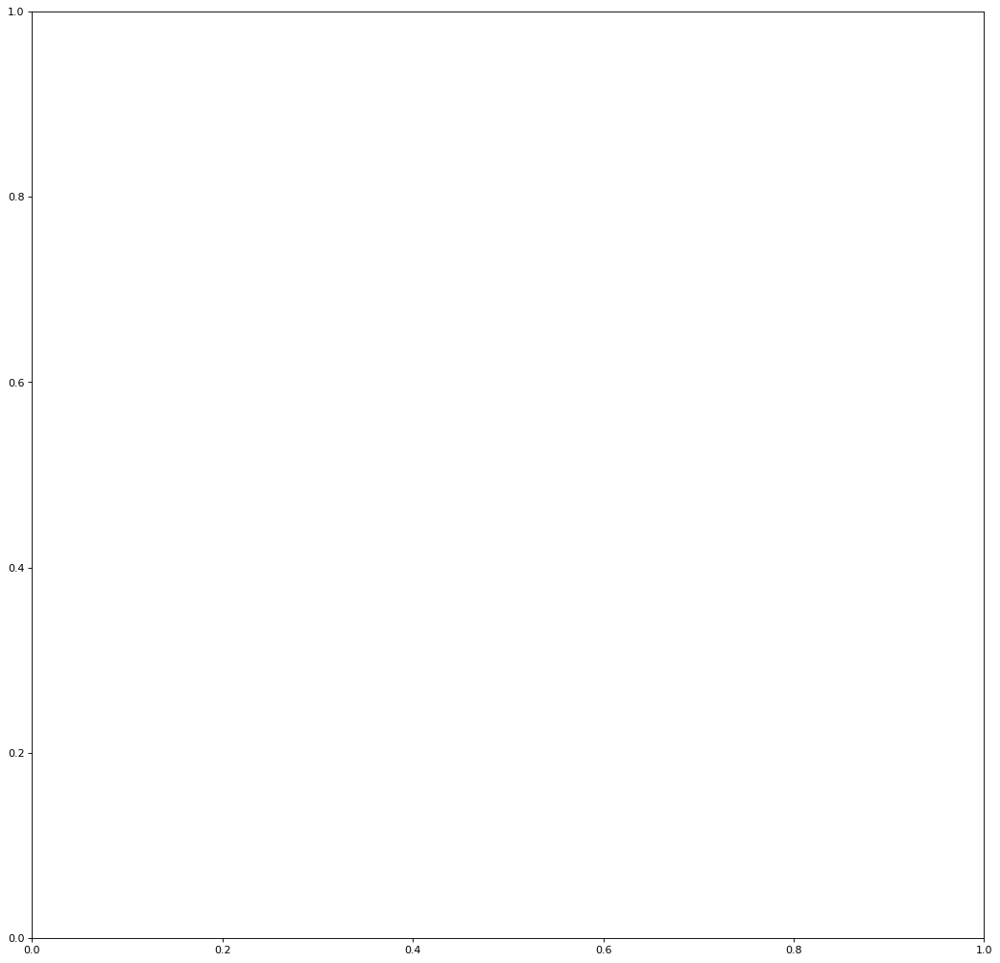

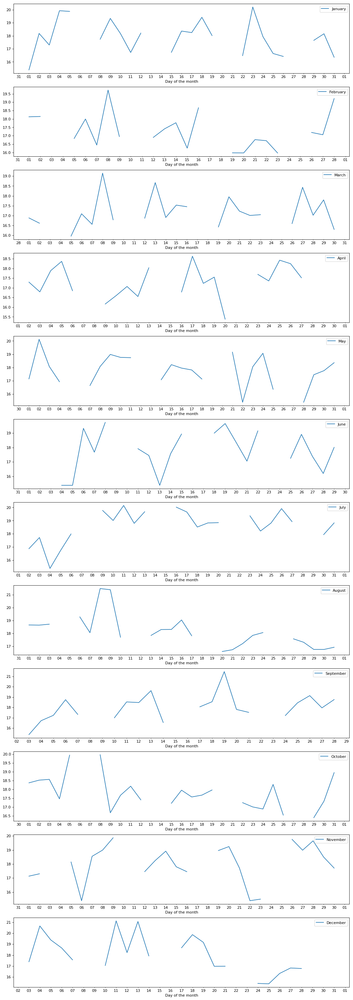

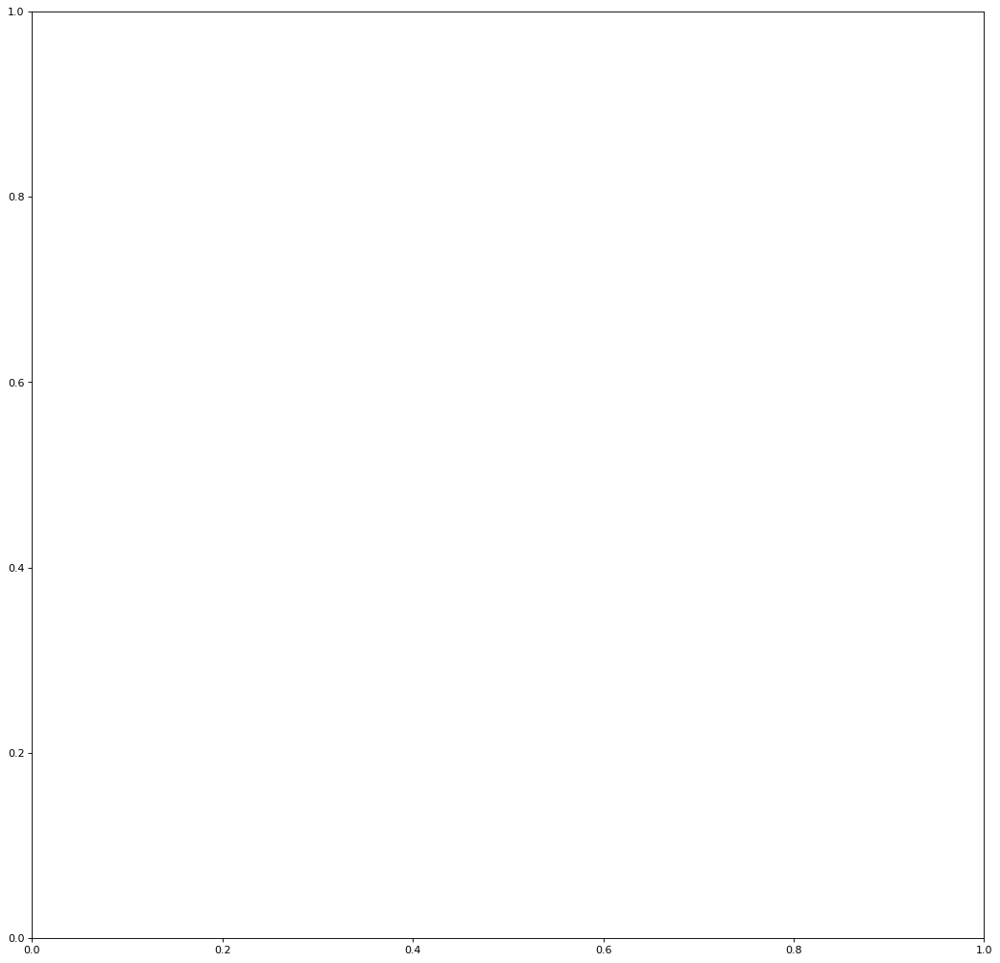

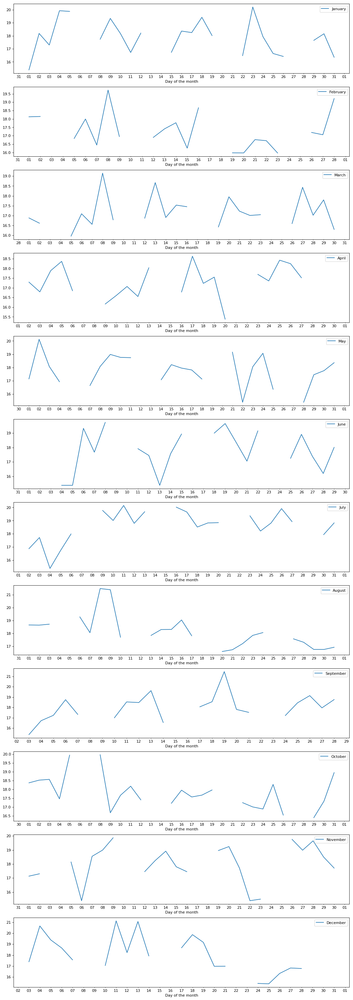

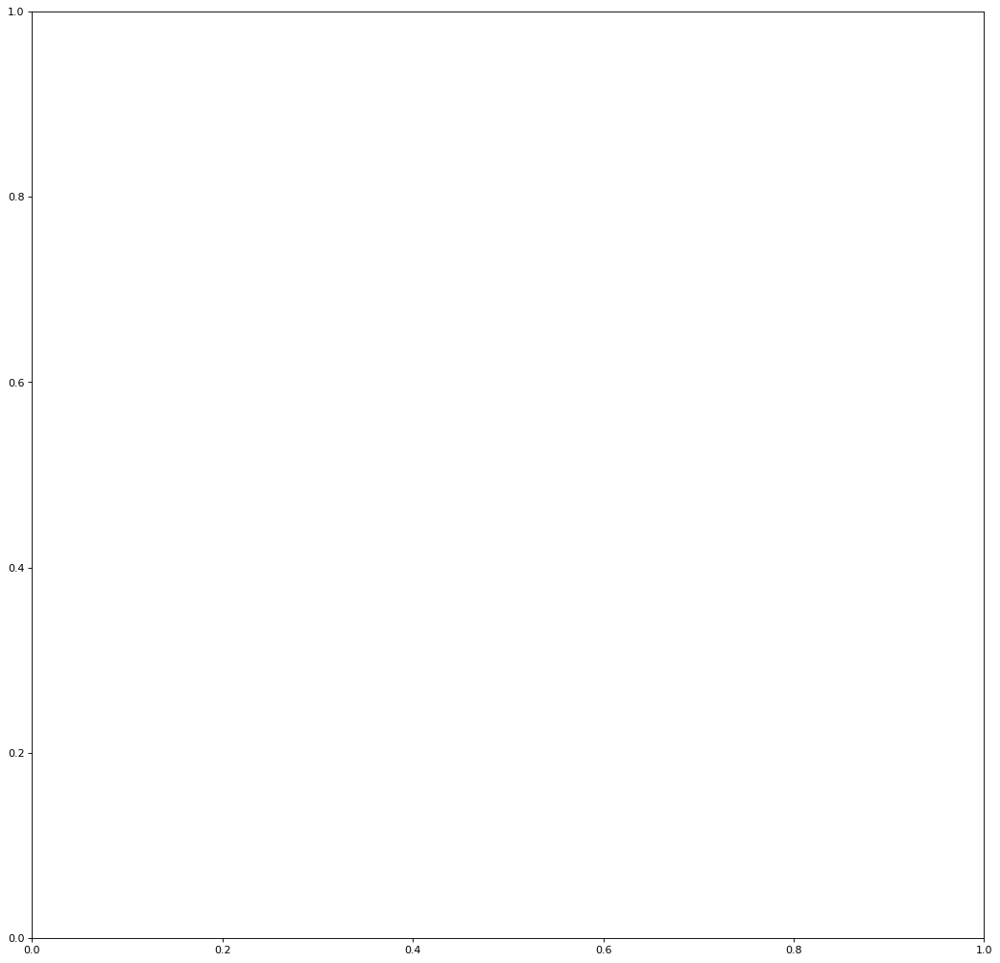

...

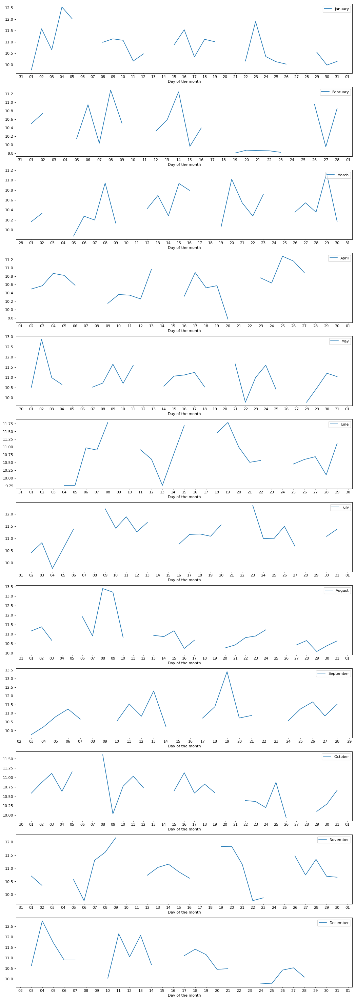

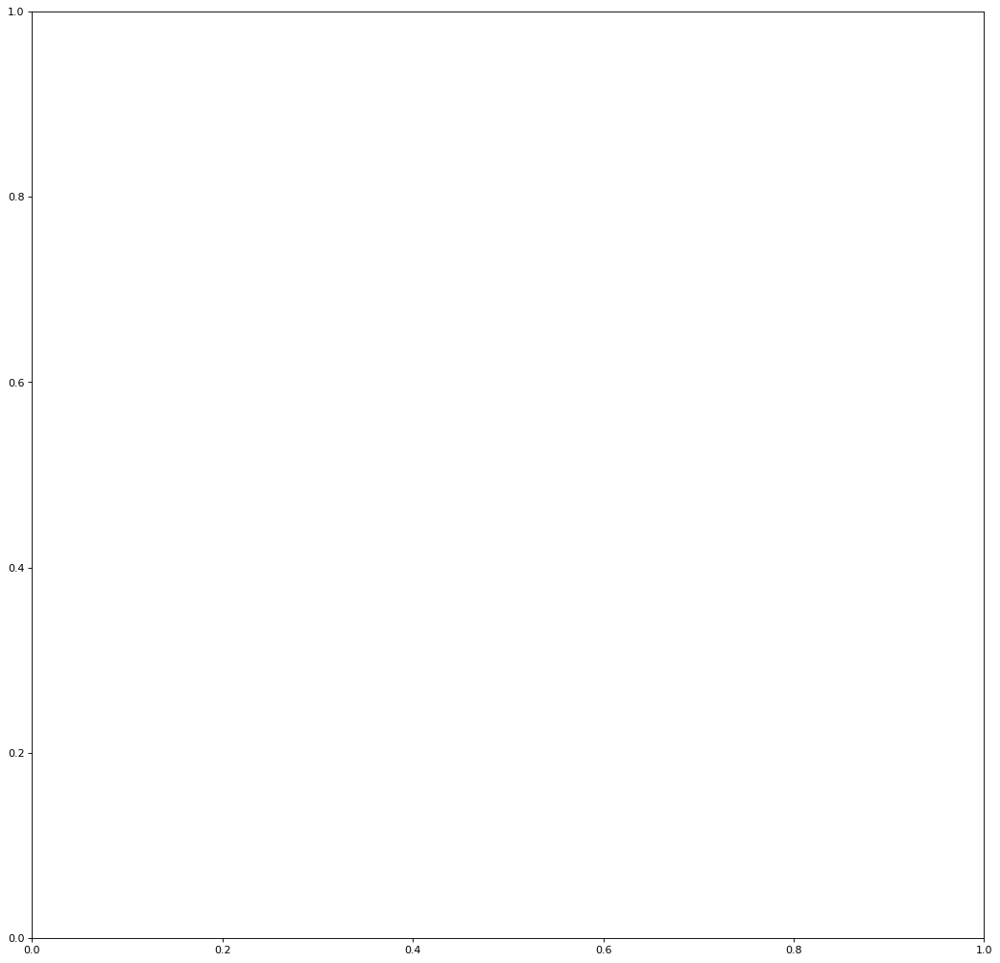

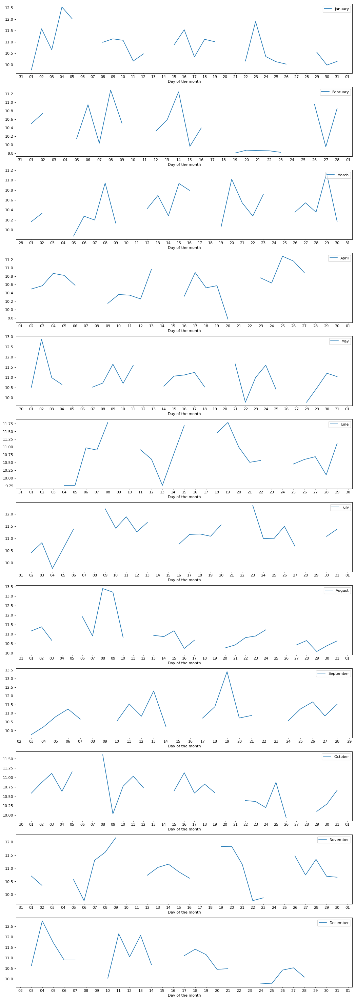

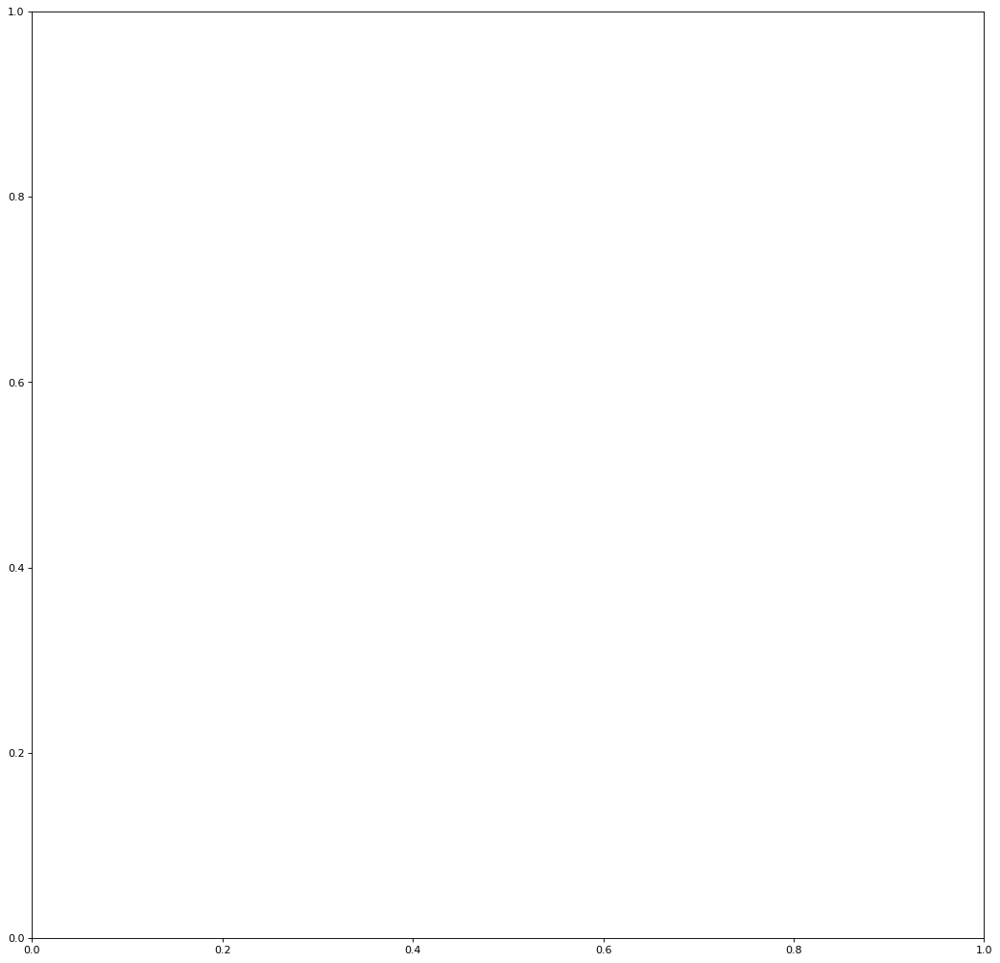

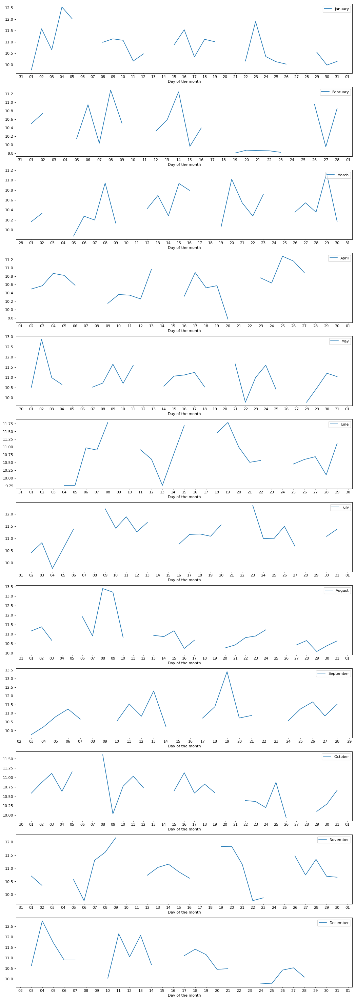

In [189]:
from __future__ import division
for element in new_cols_name:
    col1 = element + 'GP'
    col2 = element + 'HOV'
    dfnew = df[['date_time',col1]]
    dfnew = dfnew.assign(date= dfnew['date_time'].dt.date)
    dfnew = dfnew.assign(month= dfnew['date_time'].dt.month)
    dfnew = dfnew.assign(year= dfnew['date_time'].dt.year)
    dfnew =  dfnew[ dfnew['year'] == 2018]
    dfnew = dfnew[['date_time', 'month',col1]]
    dfnew = dfnew.set_index('date_time')
    fig, ax1 = plt.subplots(1,1,figsize=(16, 16), dpi= 80)
    fig=plt.figure(figsize=(16, 48), dpi= 80, facecolor='w', edgecolor='k')
    for i in dfnew['month'].unique():
        dfmonth = dfnew[dfnew['month']==i]
        dfmonth= dfmonth.resample('D').agg({str(col1):'mean'})/60
        print(dfmonth)
        print("hihii")
        ax1 = fig.add_subplot(12,1,i)
        ax1.plot(dfmonth, label = calendar.month_name[i], )
        ax1.set_xticks([])
        start_date = dt.datetime(2018, i, 1)
        ax1.xaxis.set_minor_locator(dates.DayLocator(interval=1))
        ax1.xaxis.set_minor_formatter(dates.DateFormatter('%d'))
#         plt.ylim([0,ymax[0]])
        plt.xlabel('Day of the month')
        plt.legend(loc="upper right")
        name = str(element) +"monthly.png"
    fig.savefig(name)


1
    date_time       2734GP  day
0  2018-01-01   922.800000    1
1  2018-01-02  1090.758333    2
2  2018-01-03  1037.559375    3
3  2018-01-04  1195.384722    4
4  2018-01-05  1192.287153    5
5  2018-01-06          NaN    6
6  2018-01-07          NaN    7
7  2018-01-08  1064.123264    8
8  2018-01-09  1159.981250    9
9  2018-01-10  1089.858333   10
10 2018-01-11  1003.309375   11
11 2018-01-12  1092.426389   12
12 2018-01-13          NaN   13
13 2018-01-14          NaN   14
14 2018-01-15  1003.780903   15
15 2018-01-16  1101.681250   16
16 2018-01-17  1094.780903   17
17 2018-01-18  1165.025000   18
18 2018-01-19  1080.973958   19
19 2018-01-20          NaN   20
20 2018-01-21          NaN   21
21 2018-01-22   988.430208   22
22 2018-01-23  1212.505903   23
23 2018-01-24  1076.151042   24
24 2018-01-25   998.448611   25
25 2018-01-26   984.940278   26
26 2018-01-27          NaN   27
27 2018-01-28          NaN   28
28 2018-01-29  1059.023958   29
29 2018-01-30  1089.347222   30
30 201

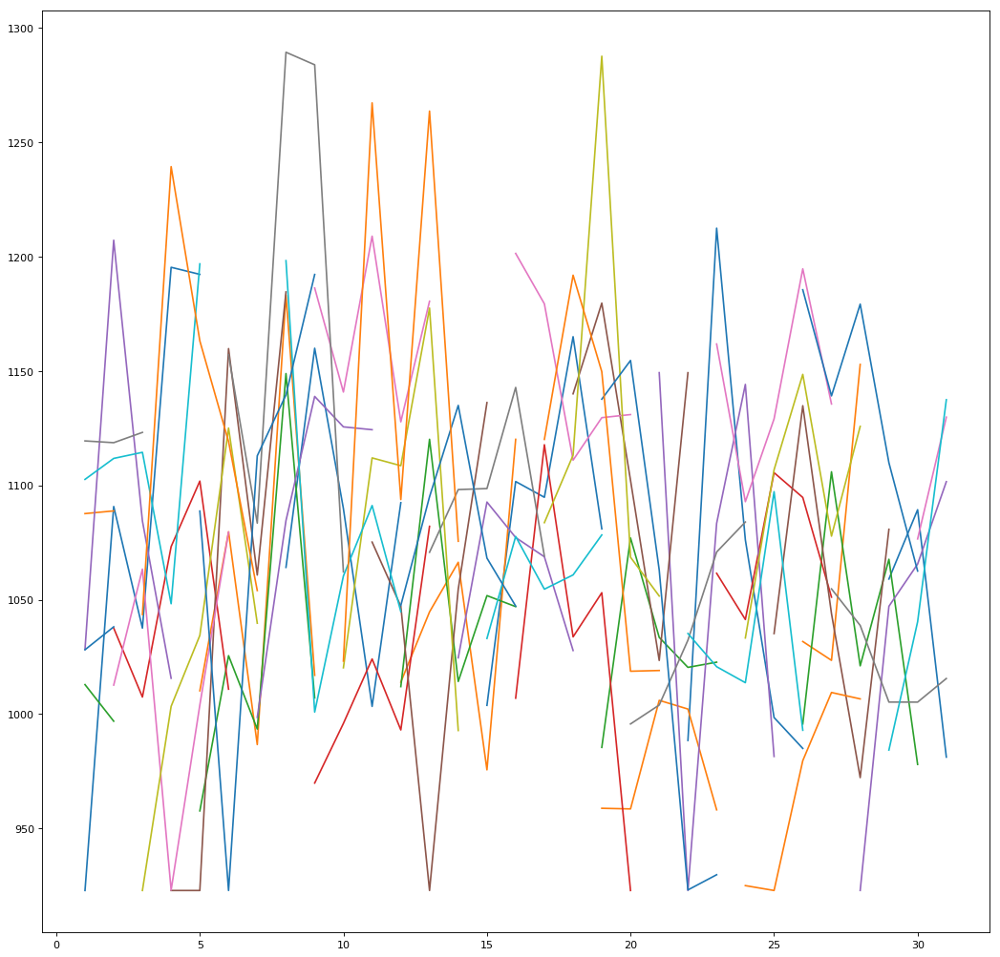

In [175]:
# median for months
import datetime
import calendar
import matplotlib.dates as dates
df['date_time'] = pd.to_datetime(df['date_time'])
for element in  ['2734']:
    col1 = element + 'GP'
    col2 = element + 'HOV'
    dfnew = df[['date_time',col1]]
    dfnew = dfnew.assign(date= dfnew['date_time'].dt.date)
    dfnew = dfnew.assign(month= dfnew['date_time'].dt.month)
    dfnew = dfnew.assign(year= dfnew['date_time'].dt.year)
    dfnew =  dfnew[ dfnew['year'] == 2018]
    dfnew = dfnew[['date_time', 'month',col1]]
    dfnew = dfnew.set_index('date_time')
    fig, ax1 = plt.subplots(1,1,figsize=(16, 16), dpi= 80, facecolor='w', edgecolor='k')
    for i in dfnew['month'].unique():
        print(i)
        dfmonth= dfnew[dfnew['month']==i]
        ymax = dfmonth.resample('D').agg({str(col1):'mean'})
        ymax.reset_index(inplace = True)
        dfy = pd.DataFrame(ymax)
        dfy['date_time'] = pd.to_datetime(dfy['date_time'])
        dfy['day'] = dfy['date_time'].dt.day
#         dfy = dfy.drop('date_time')
        print(dfy)
# #         ax1 = fig.add_subplot(12,1,i)
        ax1.plot(dfy['day'],dfy[col1], label = calendar.month_name[i] )
# #         ax1.set_xticks([])
# #         start_date = dt.datetime(2018, i, 1)
# #         ax1.xaxis.set_minor_locator(dates.DayLocator(interval=1))
# #         ax1.xaxis.set_minor_formatter(dates.DateFormatter('%d'))
# #         plt.ylim([0,ymax[0]])
# #         plt.xlabel('Day of the month')
# #         plt.legend(loc="upper right")
# #         name = str(element) +"monthly.png"
    fig.savefig(name)
  
    
    